# Implementing scVelo in mouse hippocampus development data

To compare cellDancer with other methods, this notebook shows the prediction of RNA velocity of [scVelo](https://www.nature.com/articles/s41587-020-0591-3) in mouse hippocampus development. We follow the preprocessing methods of [La Manno et al.](https://www.nature.com/articles/s41587-020-0591-3) to filter genes and cells. 18,140 cells with 2,159 genes were selected, which is the same as the datasets used in cellDancer. The input data could be downloaded from [DentateGyrus.h5ad](https:DentateGyrus.h5ad).

# Import packages

In [2]:
# %%
import numpy as np
import scvelo as scv
import torch
from umap import UMAP
from sklearn.decomposition import PCA
from scipy.stats import mannwhitneyu

import anndata as ann

#from adata_to_df import adata_to_df
import os
import sys
import glob
import pandas as pd
import math
import matplotlib.pyplot as plt
import celldancer as cd
import celldancer.cdplt as cdplt
from celldancer.cdplt import colormap

scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params(
    "scvelo", transparent=False
)  # for beautified visualization

# Load mouse hippocampal dentate gyrus neurogenesis data

In [3]:
adata=ann.read_h5ad('data/DentateGyrus.h5ad')

# scVelo

In [8]:
%%time
scv.tl.velocity(adata, vkey='steady_state_velocity', mode='steady_state',n_jobs=15)

computing velocities
    finished (0:00:03) --> added 
    'steady_state_velocity', velocity vectors for each individual cell (adata.layers)
CPU times: user 2.51 s, sys: 821 ms, total: 3.33 s
Wall time: 3.33 s


In [9]:
scv.tl.velocity_graph(adata, vkey='steady_state_velocity',n_jobs=30)

computing velocity graph (using 30/48 cores)
    finished (0:00:26) --> added 
    'steady_state_velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [10]:
%%time
scv.tl.recover_dynamics(adata,n_jobs=15)
scv.tl.velocity(adata, mode='dynamical', vkey='dynamical_velocity',n_jobs=15)

recovering dynamics (using 15/48 cores)
    finished (0:07:13) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:29) --> added 
    'dynamical_velocity', velocity vectors for each individual cell (adata.layers)
CPU times: user 33.1 s, sys: 13.5 s, total: 46.7 s
Wall time: 7min 42s


In [11]:
scv.tl.velocity_graph(adata, vkey='dynamical_velocity', variance_stabilization=True,n_jobs=30)

computing velocity graph (using 30/48 cores)
    finished (0:00:28) --> added 
    'dynamical_velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [9]:
adata.write('your_path/DentateGyrus_pred_scVelo.h5ad')

# Visualize the phase portraits of sample genes

In [12]:
adata

AnnData object with n_obs × n_vars = 18140 × 2159
    obs: 'Age', 'Cell_Conc', 'ChipID', 'ClusterName', 'Clusters', 'Comments', 'Date_Captured', 'DonorID', 'Label', 'NGI_PlateWell', 'Num_Pooled_Animals', 'PCR_Cycles', 'Plug_Date', 'Project', 'SampleID', 'SampleOK', 'Sample_Index', 'Seq_Comment', 'Seq_Lib_Date', 'Seq_Lib_Ok', 'Serial_Number', 'Sex', 'Species', 'Strain', 'TSNE1', 'TSNE2', 'Target_Num_Cells', 'Tissue', 'Transcriptome', 'cDNA_Lib_Ok', 'ngperul_cDNA', 'clusters', 'celltype', 'steady_state_velocity_self_transition', 'dynamical_velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'steady_state_velocity_gamma', 'steady_state_velocity_qreg_ratio', 'steady_state_velocity_r2', 'steady_state_velocity_genes', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'dynamical_ve

computing velocity embedding
    finished (0:00:04) --> added
    'dynamical_velocity_TSNE', embedded velocity vectors (adata.obsm)


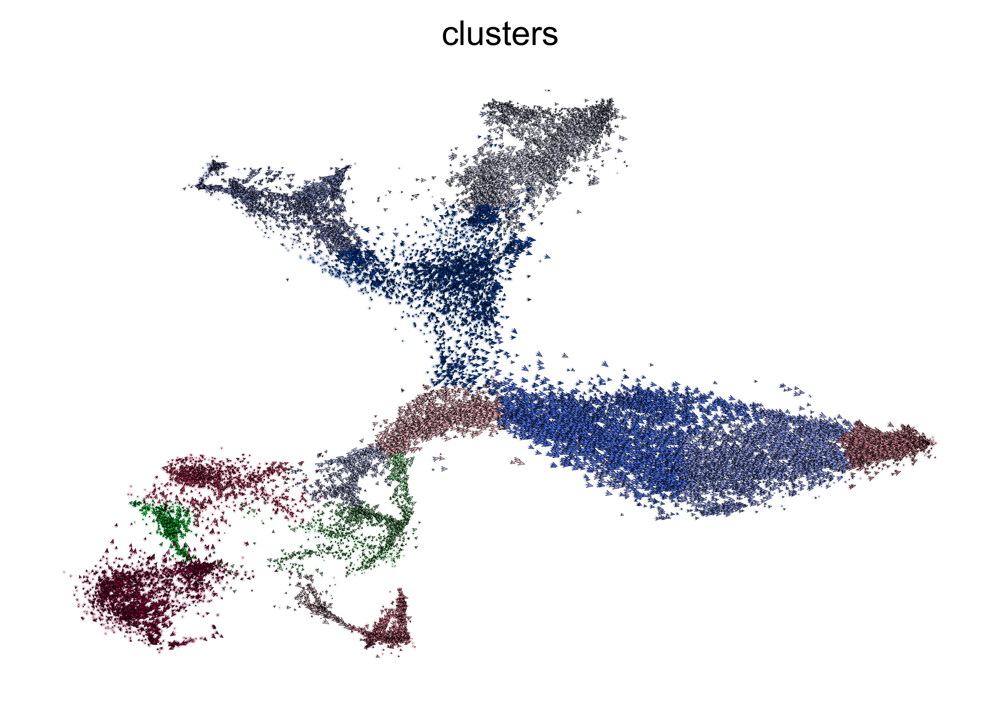

(array([[18.93108626, -1.86242872],
        [18.41989053, -1.28289536],
        [ 2.36988674, 16.86841911],
        ...,
        [-3.44127166, -4.91736425],
        [16.39419937, -6.14354947],
        [17.49085669, -4.13019009]]),
 array([[ 0.0589701 , -0.03948905],
        [ 0.06654156, -0.02828027],
        [ 0.01759314,  0.02950734],
        ...,
        [ 0.03292343,  0.06376218],
        [ 0.04784464, -0.00018268],
        [ 0.04563081, -0.03731207]]))

In [13]:
#%%capture
adata=ann.read('your_path/DentateGyrus_pred_scVelo.h5ad')

# project the RNA velocity to vector fields in the embedding space. adata.layers['velocity_TSNE'] was added.
scv.pl.velocity_embedding(
    adata,
    basis="TSNE",
    vkey="dynamical_velocity",
    arrow_length=6,
    arrow_size=1.2,
    dpi=300,
)

computing velocity embedding
    finished (0:00:04) --> added
    'steady_state_velocity_TSNE', embedded velocity vectors (adata.obsm)


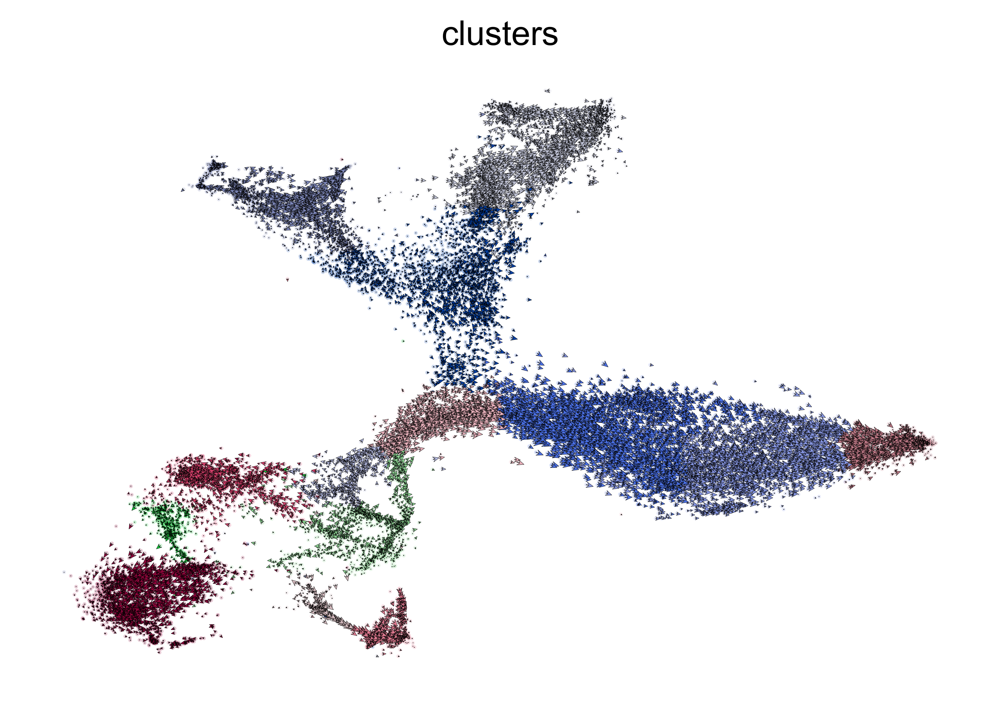

(array([[18.93108626, -1.86242872],
        [18.41989053, -1.28289536],
        [ 2.36988674, 16.86841911],
        ...,
        [-3.44127166, -4.91736425],
        [16.39419937, -6.14354947],
        [17.49085669, -4.13019009]]),
 array([[ 0.05013918, -0.03921082],
        [ 0.05595886, -0.02797246],
        [ 0.03030172,  0.01575449],
        ...,
        [ 0.03382184,  0.06192074],
        [ 0.05591819, -0.00126615],
        [ 0.03625246, -0.03739257]]))

In [17]:
# project the RNA velocity to vector fields in the embedding space. adata.layers['velocity_TSNE'] was added.
scv.pl.velocity_embedding(
    adata,
    basis="TSNE",
    vkey="steady_state_velocity",
    arrow_length=6,
    arrow_size=1.2,
    dpi=300,
)

In [18]:
adata

AnnData object with n_obs × n_vars = 18140 × 2159
    obs: 'Age', 'Cell_Conc', 'ChipID', 'ClusterName', 'Clusters', 'Comments', 'Date_Captured', 'DonorID', 'Label', 'NGI_PlateWell', 'Num_Pooled_Animals', 'PCR_Cycles', 'Plug_Date', 'Project', 'SampleID', 'SampleOK', 'Sample_Index', 'Seq_Comment', 'Seq_Lib_Date', 'Seq_Lib_Ok', 'Serial_Number', 'Sex', 'Species', 'Strain', 'TSNE1', 'TSNE2', 'Target_Num_Cells', 'Tissue', 'Transcriptome', 'cDNA_Lib_Ok', 'ngperul_cDNA', 'clusters', 'celltype', 'steady_state_velocity_self_transition', 'dynamical_velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'steady_state_velocity_gamma', 'steady_state_velocity_qreg_ratio', 'steady_state_velocity_r2', 'steady_state_velocity_genes', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'dynamical_ve

In [20]:
# transfer anndata to pandas dataframe
scVelo_esti_df_neuro_dynamical=adata_to_df(adata,us_pred_para=['dynamical_velocity_u','dynamical_velocity'],embed_para='X_TSNE',embed_pred_para='dynamical_velocity_TSNE')

In [21]:
scVelo_esti_df_neuro_dynamical

,gene_name,unsplice,splice,unsplice_predict,splice_predict,cellID,clusters,embedding1,embedding2,velocity1,velocity2
0,Rgs20,0.069478,0.021971,0.624926,0.026245,10X83_2:AAACGGGGTCTCTTTAx,ImmGranule2,18.931086,-1.862429,0.058970,-0.039489
1,Rgs20,0.085834,0.016256,0.641566,0.020394,10X83_2:AACCATGGTTCAACCAx,ImmGranule2,18.419891,-1.282895,0.066542,-0.028280
2,Rgs20,0.068644,0.047774,0.625700,0.051272,10X83_2:AACACGTTCTGAAAGAx,CA2-3-4,2.369887,16.868419,0.017593,0.029507
3,Rgs20,0.045387,0.018101,0.603877,0.020904,10X83_2:AAAGATGCATTGAGCTx,CA,-5.351040,10.676485,-0.040393,0.034447
4,Rgs20,0.040457,0.012846,0.598290,0.015968,10X83_2:AACCATGTCTACTTACx,CA1-Sub,-6.189126,11.754900,-0.026541,0.016862
...,...,...,...,...,...,...,...,...,...,...,...
39164255,Gpm6b,0.876650,1.276089,1.889678,1.528107,10X84_3:TTTCCTCCACCATCCTx,ImmGranule1,10.812611,-2.487668,0.054475,-0.036482
39164256,Gpm6b,2.024897,5.152006,1.248628,4.943464,10X84_3:TTTGTCACATGAAGTAx,CA2-3-4,8.246204,23.482788,0.019548,-0.001384
39164257,Gpm6b,1.848051,1.491445,2.499846,1.972642,10X84_3:TTTCCTCCACGGTAAGx,nIPC,-3.441272,-4.917364,0.032923,0.063762
39164258,Gpm6b,0.696361,1.189091,0.848145,1.710904,10X84_3:TTTGTCAAGCGTCAAGx,ImmGranule2,16.394199,-6.143549,0.047845,-0.000183


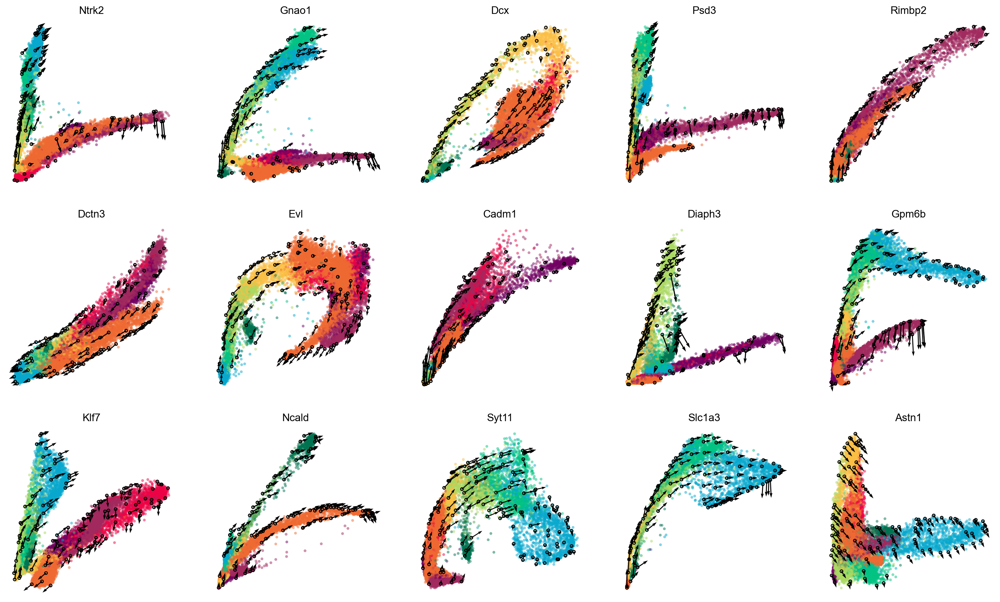

In [23]:
gene_list=['Ntrk2','Gnao1','Dcx','Psd3','Rimbp2','Dctn3','Evl','Cadm1','Diaph3','Gpm6b','Klf7','Ncald','Syt11','Slc1a3','Astn1']

ncols=5
height=math.ceil(len(gene_list)/5)*4
fig = plt.figure(figsize=(20,height))

for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.scatter_gene(
        ax=ax,
        x='splice',
        y='unsplice',
        cellDancer_df=scVelo_esti_df_neuro_dynamical,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5,
        s = 10,
        velocity=True,
        gene=gene_list[i])

    ax.set_title(gene_list[i])
    ax.axis('off')

plt.show()

In [24]:
help(scv.tl.velocity_graph)

Help on function velocity_graph in module scvelo.tools.velocity_graph:

velocity_graph(data, vkey='velocity', xkey='Ms', tkey=None, basis=None, n_neighbors=None, n_recurse_neighbors=None, random_neighbors_at_max=None, sqrt_transform=None, variance_stabilization=None, gene_subset=None, compute_uncertainties=None, approx=None, mode_neighbors='distances', copy=False, n_jobs=None, backend='loky')
    Computes velocity graph based on cosine similarities.
    
    The cosine similarities are computed between velocities and potential cell state
    transitions, i.e. it measures how well a corresponding change in gene expression
    :math:`\delta_{ij} = x_j - x_i` matches the predicted change according to the
    velocity vector :math:`\nu_i`,
    
    .. math::
        \pi_{ij} = \cos\angle(\delta_{ij}, \nu_i)
        = \frac{\delta_{ij}^T \nu_i}{\left\lVert\delta_{ij}\right\rVert
        \left\lVert \nu_i \right\rVert}.
    
    Arguments
    ---------
    data: :class:`~anndata.AnnData`
   